# Content

Using Laion 2.5 to assess if new architecture yields better results

In [ ]:
import json
import torch
from PIL import Image
from aesthetic_predictor_v2_5 import convert_v2_5_from_siglip
from pathlib import Path

# !pip install aesthetic_predictor_v2_5

####################################
# LAION 2.5 Instantiation
####################################

model, preprocessor = convert_v2_5_from_siglip(
    low_cpu_mem_usage=True,
    trust_remote_code=True,
)
model = model.to(torch.bfloat16).cuda()

def aesthetic_score(image):
    """PIL Image -> aesthetic score"""
    pixel_values = (
        preprocessor(images=image, return_tensors="pt")
        .pixel_values.to(torch.bfloat16)
        .cuda()
    )
    pixel_values
    with torch.inference_mode():
        score = model(pixel_values).logits.squeeze().float().cpu().numpy()
    return score

############################################
# Load Images and Compute Scores
############################################

# file_name = "laion_scores/laion_scores_new_model.json"
# folder_path = "pictures_new_weights/output/new_model"

# img_dir = Path(folder_path)
# scores = {}

# for path in sorted(img_dir.glob("*.jpg")):
#     base, metric = path.stem.rsplit("_", 1)
#     metric = {"cos": "cosine", "prs": "pearson", "rmse": "rmse"}.get(metric, metric)
#     img = Image.open(path)
#     score = aesthetic_score(img)
#     scores.setdefault(base, {"rmse": None, "cosine": None, "pearson": None})[metric] = score.item()

# with open(file_name, "w") as f:
#     json.dump(scores, f, indent=2)

# file_name = "laion_scores/laion_scores_old_model.json"
# folder_path = "pictures_new_weights/output/old_model"

# img_dir = Path(folder_path)
# scores = {}

# for path in sorted(img_dir.glob("*.jpg")):
#     base, metric = path.stem.rsplit("_", 1)
#     metric = {"cos": "cosine", "prs": "pearson", "rmse": "rmse"}.get(metric, metric)
#     img = Image.open(path)
#     score = aesthetic_score(img)
#     scores.setdefault(base, {"rmse": None, "cosine": None, "pearson": None})[metric] = score.item()

# with open(file_name, "w") as f:
#     json.dump(scores, f, indent=2)

/home/antonello03/anaconda3/envs/py31/lib/python3.11/site-packages/huggingface_hub/file_download.py:943: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [13]:
file_name_new = "laion_scores/laion_scores_new_model.json"
file_name_old = "laion_scores/laion_scores_old_model.json"

with open(file_name_new, "r") as f:
    scores_new = json.load(f)

with open(file_name_old, "r") as f:
    scores_old = json.load(f)

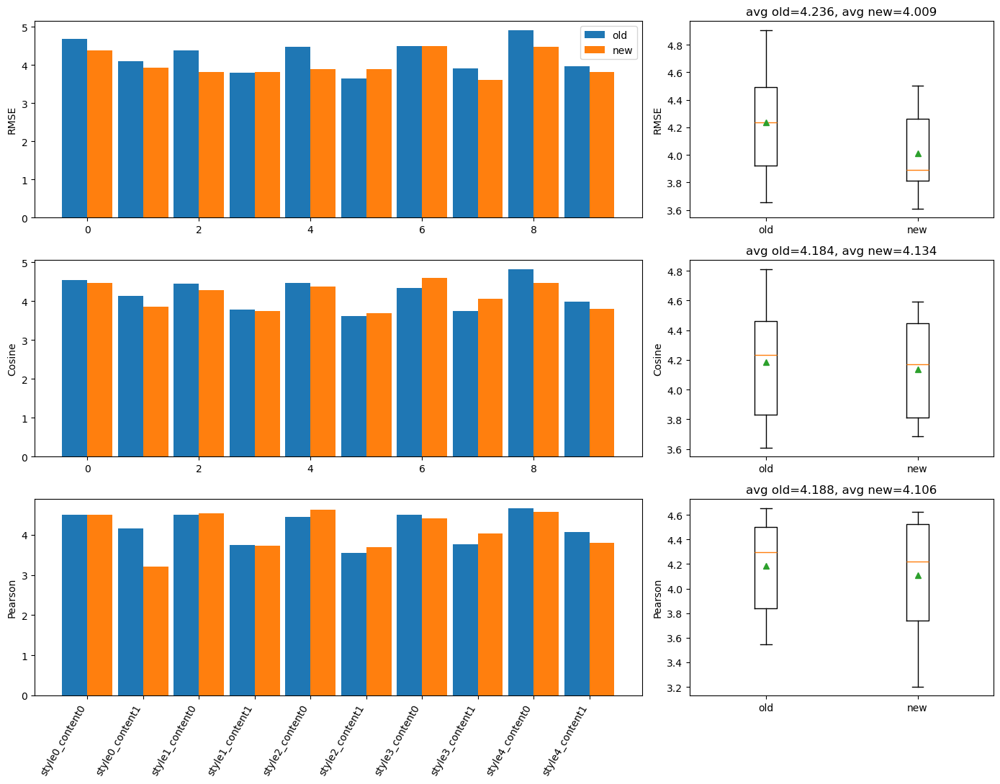

In [21]:
import numpy as np

keys = list(scores_old.keys())

def vals(metric, d):
    return [d[k][metric] for k in keys]

rmse_old, rmse_new = vals("rmse", scores_old), vals("rmse", scores_new)
cos_old,  cos_new  = vals("cosine", scores_old), vals("cosine", scores_new)
prs_old,  prs_new  = vals("pearson", scores_old), vals("pearson", scores_new)

x = np.arange(len(keys))
w = 0.45

fig, axs = plt.subplots(3, 2, figsize=(max(14, 0.7*len(keys)), 11), gridspec_kw={"width_ratios": [2, 1]})
L, R = axs[:,0], axs[:,1]

L[0].bar(x - w/2, rmse_old, w, label="old")
L[0].bar(x + w/2, rmse_new, w, label="new")
L[0].set_ylabel("RMSE"); L[0].legend()

L[1].bar(x - w/2, cos_old, w)
L[1].bar(x + w/2, cos_new, w)
L[1].set_ylabel("Cosine")

L[2].bar(x - w/2, prs_old, w)
L[2].bar(x + w/2, prs_new, w)
L[2].set_ylabel("Pearson")
L[2].set_xticks(x, keys, rotation=60, ha="right")

def box(ax, old, new, ylab):
    ax.boxplot([old, new], showmeans=True)
    ax.set_xticks([1, 2])
    ax.set_xticklabels(["old", "new"])
    ax.set_ylabel(ylab)
    ax.set_title(f"avg old={np.mean(old):.3f}, avg new={np.mean(new):.3f}")

box(R[0], rmse_old, rmse_new, "RMSE")
box(R[1], cos_old,  cos_new,  "Cosine")
box(R[2], prs_old,  prs_new,  "Pearson")

plt.tight_layout()
plt.show()


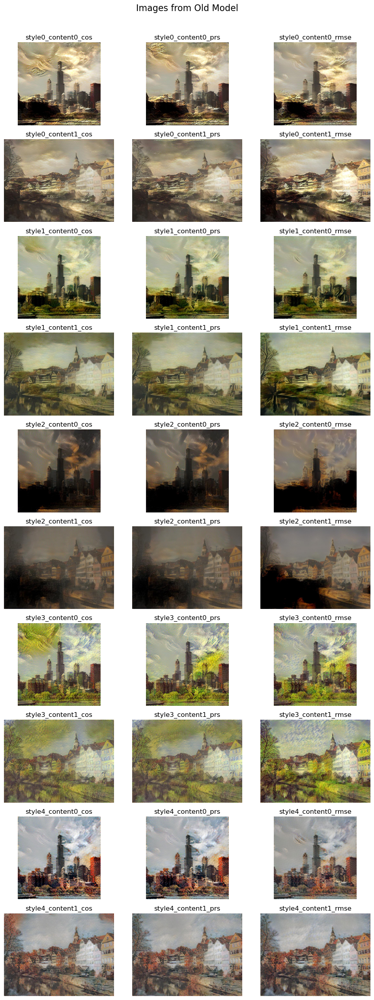

In [35]:
img_path = "pictures_new_weights/output/old_model"
import os
from PIL import Image
import matplotlib.pyplot as plt

img_dir = Path(img_path)
imgs = sorted(img_dir.glob("*.jpg"))

fig, axs = plt.subplots(10, 3, figsize=(10, 25))
axs = axs.flatten()

for ax, img_path in zip(axs, imgs):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(img_path.stem)
    ax.axis("off")

fig.suptitle("Images from Old Model", fontsize=16, y=1.01)

plt.tight_layout()
plt.show()

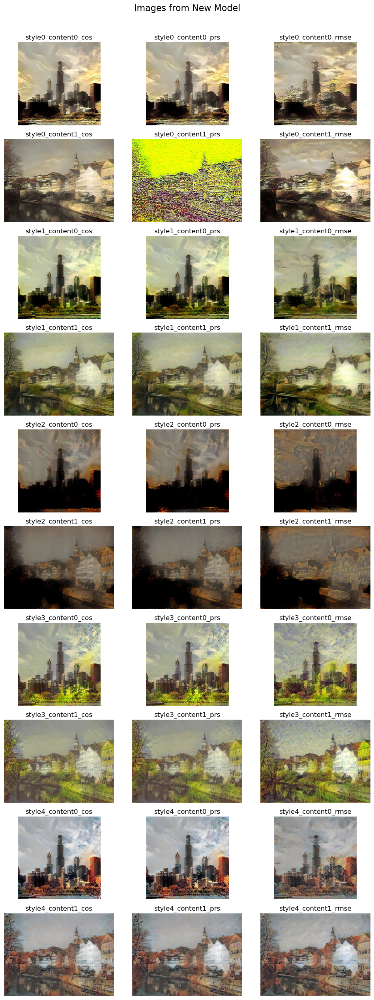

In [36]:
img_path = "pictures_new_weights/output/new_model"
import os
from PIL import Image
import matplotlib.pyplot as plt

img_dir = Path(img_path)
imgs = sorted(img_dir.glob("*.jpg"))

fig, axs = plt.subplots(10, 3, figsize=(10, 25))
axs = axs.flatten()

for ax, img_path in zip(axs, imgs):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(img_path.stem)
    ax.axis("off")

fig.suptitle("Images from New Model", fontsize=16, y=1.01)

plt.tight_layout()
plt.show()

Evaluating new weights for losses layers

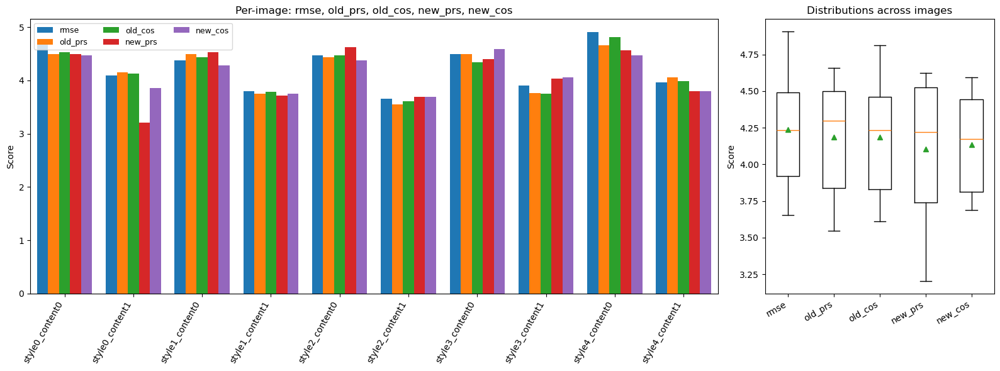

In [8]:
import json, numpy as np
import matplotlib.pyplot as plt

file_name_new = "laion_scores/laion_scores_new_model.json"
file_name_old = "laion_scores/laion_scores_old_model.json"

with open(file_name_new, "r") as f:
    scores_new = json.load(f)
with open(file_name_old, "r") as f:
    scores_old = json.load(f)

keys = list(scores_old.keys())

def vals(metric, d):
    # NaN if metric missing for a key
    return [d.get(k, {}).get(metric, np.nan) for k in keys]

# Order requested: rmse, old_prs, old_cos, new_prs, new_cos
rmse      = vals("rmse",     scores_old)   # from old
old_prs   = vals("pearson",  scores_old)
old_cos   = vals("cosine",   scores_old)
new_prs   = vals("pearson",  scores_new)
new_cos   = vals("cosine",   scores_new)

series = [rmse, old_prs, old_cos, new_prs, new_cos]
labels = ["rmse", "old_prs", "old_cos", "new_prs", "new_cos"]

x = np.arange(len(keys))
w = 0.16
offsets = np.array([-2, -1, 0, 1, 2]) * w  # 5 bars per group

fig, (ax_bar, ax_box) = plt.subplots(
    1, 2, figsize=(16, 6),
    gridspec_kw={"width_ratios": [3, 1]}
)

# --- Grouped bars (left) ---
for off, y, lab in zip(offsets, series, labels):
    ax_bar.bar(x + off, y, w, label=lab)
ax_bar.set_xticks(x, keys, rotation=60, ha="right")
ax_bar.set_ylabel("Score")
ax_bar.set_title("Per-image: rmse, old_prs, old_cos, new_prs, new_cos")
ax_bar.legend(ncol=3, fontsize=9)
ax_bar.margins(x=0.01)

# --- Boxplot with 5 boxes (right) ---
def dropna(arr):
    a = np.asarray(arr, dtype=float)
    return a[~np.isnan(a)]

ax_box.boxplot([dropna(s) for s in series], showmeans=True)
ax_box.set_xticks(range(1, 6))
ax_box.set_xticklabels(labels, rotation=30, ha="right")
ax_box.set_ylabel("Score")
ax_box.set_title("Distributions across images")

plt.tight_layout()
plt.show()


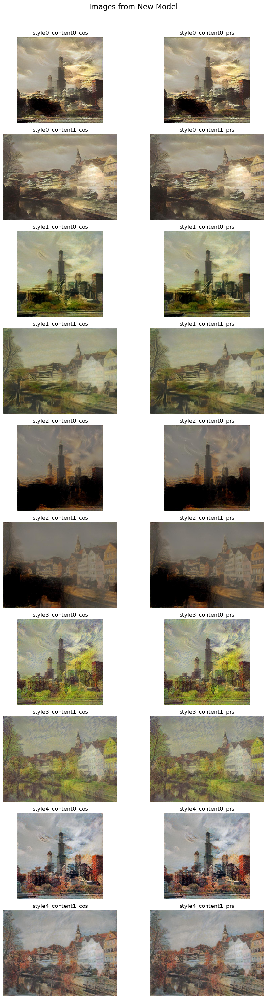

In [18]:
img_path = "synthetized_images_dynamic_weights"
import os
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

img_dir = Path(img_path)
imgs = sorted(img_dir.glob("*.jpg"))

fig, axs = plt.subplots(10, 2, figsize=(10, 30))
axs = axs.flatten()

for ax, img_path in zip(axs, imgs):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(img_path.stem)
    ax.axis("off")

fig.suptitle("Images from New Model", fontsize=16, y=1.01)

plt.tight_layout()
plt.show()